# City of Toronto Bicycle Collisions Data

This dataset provides detailed information on bicycle collisions that have occurred within the City of Toronto. It includes data on the location, time, and circumstances of each incident, offering valuable insights into patterns and trends related to bicycle safety. By analyzing this data, we can better understand the factors contributing to bicycle collisions and identify areas where improvements in infrastructure or safety measures may be needed. Whether for research, policy-making, or public awareness, this data serves as a vital tool for improving urban cycling conditions and reducing accidents.

## Setup Notebook

In [1]:
# Import 3rd party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from IPython.display import display
import geopandas as gpd
from shapely.geometry import Point

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

/Users/aaliyashaikh/Library/Python/3.8/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Import GeoJson Data

To begin analyzing bicycle collision data, we first need to load the dataset. The data is stored in GeoJSON format, which contains geographical information that can be processed using a GeoDataFrame in the geopandas library. Below, we import the dataset and display the first few rows to get an overview of the data structure:

In [2]:
# Load the dataset from the specified path and read it as a GeoDataFrame
# The dataset contains traffic collision data in GeoJSON format, which includes geospatial information (e.g., location of collisions)
collision_data = gpd.read_file('../../data_files/Traffic_Collisions_Open_Data_-6024052409346627848.geojson')

# Display the first few rows of the dataset to get an overview of its structure and contents
collision_data.head()


,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_MONTH,OCC_DOW,OCC_YEAR,OCC_HOUR,DIVISION,FATALITIES,INJURY_COLLISIONS,...,HOOD_158,NEIGHBOURHOOD_158,LONG_WGS84,LAT_WGS84,AUTOMOBILE,MOTORCYCLE,PASSENGER,BICYCLE,PEDESTRIAN,geometry
0,1,GO-20148000005,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,13,D23,0,NO,...,006,Kingsview Village-The Westway (6),-79.558639,43.694246,YES,NO,NO,NO,NO,POINT (-79.55864 43.69425)
1,2,GO-20148000085,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,19,D42,0,NO,...,128,Agincourt South-Malvern West (128),-79.281506,43.784746,YES,NO,NO,NO,NO,POINT (-79.28151 43.78475)
2,3,GO-20141260499,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,2,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)
3,4,GO-20141260663,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,3,NSA,0,NO,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)
4,5,GO-20141261162,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,5,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)


We can see that there are a lot of collisions in the City of Toronto. Now let's analyze that data in the dataset. 

## Data Analysis

Let's explore the features within the collision dataset!

In [3]:
# Check the number of columns and rows
collision_data.shape

(704704, 22)

In [4]:
# Check the columns in DataFrame
collision_data.columns

Index(['OBJECTID', 'EVENT_UNIQUE_ID', 'OCC_DATE', 'OCC_MONTH', 'OCC_DOW',
       'OCC_YEAR', 'OCC_HOUR', 'DIVISION', 'FATALITIES', 'INJURY_COLLISIONS',
       'FTR_COLLISIONS', 'PD_COLLISIONS', 'HOOD_158', 'NEIGHBOURHOOD_158',
       'LONG_WGS84', 'LAT_WGS84', 'AUTOMOBILE', 'MOTORCYCLE', 'PASSENGER',
       'BICYCLE', 'PEDESTRIAN', 'geometry'],
      dtype='object')

Based on the Toronto Police Service's Traffic Collisions Open Data (ASR-T-TBL-001), here is a description of each column in the dataset:

- OBJECTID: A unique identifier for each collision record.
- EVENT_UNIQUE_ID: A unique code assigned to each specific event.
- OCC_DATE: The date and time of the collision occurrence.
- OCC_MONTH: The month in which the collision occurred.
- OCC_DOW: The day of the week on which the collision happened.
- OCC_YEAR: The year in which the collision occurred.
- OCC_HOUR: The hour of the day (24-hour format) when the collision took place.
- DIVISION: The division code where the incident was recorded.
- FATALITIES: The number of fatalities resulting from the collision.
- INJURY_COLLISIONS: Indicates whether the collision involved injuries (e.g., "YES" or "NO").
- FTR_COLLISIONS: Indicates whether the collision was a "Fail to Remain" incident.
- PD_COLLISIONS: Indicates whether the collision involved property damage.
- HOOD_158: Numeric code representing the neighborhood where the collision occurred.
- NEIGHBOURHOOD_158: The name of the neighborhood and its associated number.
- LONG_WGS84: Longitude of the collision location (in WGS84 coordinate system).
- LAT_WGS84: Latitude of the collision location (in WGS84 coordinate system).
- AUTOMOBILE: Indicates if an automobile was involved in the collision (e.g., "YES" or "NO").
- MOTORCYCLE: Indicates if a motorcycle was involved in the collision.
- PASSENGER: Indicates if a passenger vehicle was involved in the collision.
- BICYCLE: Indicates if a bicycle was involved in the collision.
- PEDESTRIAN: Indicates if a pedestrian was involved in the collision.
- geometry: A spatial coordinate (likely projected coordinate system) for mapping the location.


In [5]:
# Check data types per column
print(collision_data.dtypes)

OBJECTID                int64
EVENT_UNIQUE_ID        object
OCC_DATE               object
OCC_MONTH              object
OCC_DOW                object
OCC_YEAR               object
OCC_HOUR               object
DIVISION               object
FATALITIES              int64
INJURY_COLLISIONS      object
FTR_COLLISIONS         object
PD_COLLISIONS          object
HOOD_158               object
NEIGHBOURHOOD_158      object
LONG_WGS84            float64
LAT_WGS84             float64
AUTOMOBILE             object
MOTORCYCLE             object
PASSENGER              object
BICYCLE                object
PEDESTRIAN             object
geometry             geometry
dtype: object


In [6]:
# Check numerical statistics for each column
collision_data.describe()

,OBJECTID,FATALITIES,LONG_WGS84,LAT_WGS84
count,704704.000000,704704.000000,704704.000000,704704.000000
mean,352352.500000,0.000873,-66.342691,36.528215
std,203430.666387,0.030053,29.423231,16.200397
min,1.000000,0.000000,-79.639247,0.000000
25%,176176.750000,0.000000,-79.444829,43.644346
50%,352352.500000,0.000000,-79.370469,43.692500
75%,528528.250000,0.000000,-79.258521,43.751480
max,704704.000000,3.000000,0.000000,43.853164


In this step, we are dropping all columns from the dataset except for those that are directly relevant to bicycle collisions. This is done to streamline the data and focus specifically on the information that pertains to bicycle-related incidents, which allows for more targeted analysis. By removing unnecessary columns, we reduce complexity and ensure that subsequent steps in data processing and analysis are more efficient and manageable.


In [7]:
# Drop columns
collision_data = collision_data.drop(columns=[
    'OBJECTID',               # Unique identifier, not informative for analysis
    'EVENT_UNIQUE_ID',        # Another unique identifier, redundant
    'HOOD_158',               # Numeric code for neighborhoods, redundant with neighborhood name
    'INJURY_COLLISIONS',      # Specific collision categories, may not fit broader analysis
    'NEIGHBOURHOOD_158',      # Redundant if detailed spatial analysis isn't required
    'OCC_MONTH',              # Month derivable from OCC_DATE
    'OCC_YEAR',               # Year derivable from OCC_DATE
    'OCC_DOW',                # Day of week derivable from OCC_DATE
    'DIVISION',               # Redundant for neighborhood-focused analysis
    'PASSENGER',              # Overlaps with automobile classification
    'AUTOMOBILE',             # May be less relevant if focusing on broader vehicle data
    'FATALITIES',             # May not fit broad collision trends
    'FTR_COLLISIONS',         # Specific collision subcategories
    'PD_COLLISIONS',          # Specific collision subcategories
    'MOTORCYCLE',             # May not fit focus of general collision analysis
    'PEDESTRIAN',             # May not fit focus of general collision analysis
], errors='ignore')

# Rename columns in the GeoDataFrame
collision_data.rename(columns={
    'OCC_DATE': 'DATE',            # Rename to better indicate the data's purpose
    'LONG_WGS84': 'LONGITUDE',     # Simplify and clarify the name
    'LAT_WGS84': 'LATITUDE',       # Simplify and clarify the name
    'OCC_HOUR': 'HOUR'             # Rename for consistency
}, inplace=True)

# Check if columns are removed and remaining columns have been renamed
collision_data.columns


Index(['DATE', 'HOUR', 'LONGITUDE', 'LATITUDE', 'BICYCLE', 'geometry'], dtype='object')

## Data Cleaning

Data cleaning for the collision dataset ensures:

- Accuracy: Removes errors and inconsistencies.
- Efficiency: Streamlines the dataset for quicker and easier analysis.
- Reliability: Produces trustworthy insights and recommendations.
- Focus: Tailors the data for the specific analysis of collision patterns and trends.

This code below is used to convert the 'collision_date' column in the dataset into a datetime format. Converting the column ensures that the dates are in a standardized format that allows for easier manipulation and analysis (e.g., filtering by date, time-based grouping). The column name 'DATE' should be replaced with the actual name of the date column in your dataset if different. After the conversion, we verify the results by displaying the first few rows of the dataset to confirm the transformation.

Given the large size of the traffic collision dataset, it would be inefficient to work with the entire dataset when we're only interested in data from 2014 to 2023. To streamline our analysis, we will filter the dataset to focus solely on the relevant records from these years. This approach reduces the amount of data we're working with and helps optimize processing time. 

In [8]:
# Convert the 'collision_date' column to datetime (replace 'collision_date' with the actual column name)
collision_data['DATE'] = pd.to_datetime(collision_data['DATE'])

# Filter data from 2019 to 2023 and drop all other entries
collision_data_filtered = collision_data[(collision_data['DATE'].dt.year >= 2014) & 
                                         (collision_data['DATE'].dt.year <= 2023)]

# Verify the results by displaying the first few rows
collision_data_filtered.head()


,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
0,2014-01-01 05:00:00,13,-79.558639,43.694246,NO,POINT (-79.55864 43.69425)
1,2014-01-01 05:00:00,19,-79.281506,43.784746,NO,POINT (-79.28151 43.78475)
2,2014-01-01 05:00:00,2,0.000000,0.000000,NO,POINT (0.00000 0.00000)
3,2014-01-01 05:00:00,3,0.000000,0.000000,NO,POINT (0.00000 0.00000)
4,2014-01-01 05:00:00,5,0.000000,0.000000,NO,POINT (0.00000 0.00000)


Before proceeding with any analysis, it's important to check the dataset for missing values. Missing or incomplete data can lead to inaccurate results or errors in processing. The following code will help us identify if there are any missing values in the traffic collision dataset and show the number of missing entries for each column:

In [9]:
# Check for missing values
print(collision_data_filtered.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      4
geometry     0
dtype: int64


Oh no! There are 4 missinf 'BICYCLE' enteries. This code removes any rows from the dataset that contain missing (NaN) values. By calling dropna(), we ensure that only complete records are retained for analysis, which helps maintain the integrity of the dataset. After cleaning the data, we verify the result by checking for any remaining missing values using isnull().sum(). This step ensures that no NaN values persist in the cleaned dataset, allowing for more reliable analysis moving forward.

In [10]:
# Drop rows with any NaN values
collision_data_filtered = collision_data_filtered.dropna()

# Verify the result by checking the number of missing values after dropping NaNs
print(collision_data_filtered.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      0
geometry     0
dtype: int64


Although we've removed all null (NaN) values, the dataset still contains placeholder values like '0', 'No', or 'N/R', which provide no useful information and are effectively equivalent to missing data. The following code will remove all rows where any column contains these values, ensuring that the dataset only includes meaningful entries for further analysi

In [11]:
# Drop rows where LONGITUDE or LATITUDE values are 0 or BICYCLE is 'NO' or 'N/R'
collision_data_bicycles = collision_data_filtered[
    (collision_data_filtered['LONGITUDE'] != 0) & 
    (collision_data_filtered['LATITUDE'] != 0) & 
    (collision_data_filtered['BICYCLE'] != 'NO') &
    (collision_data_filtered['BICYCLE'] != 'N/R')
]

# Verify the results by displaying the first few rows
collision_data_bicycles.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
89,2014-01-02 05:00:00,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864)
351,2014-01-03 05:00:00,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254)
1857,2014-01-09 05:00:00,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697)
1891,2014-01-09 05:00:00,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558)
2271,2014-01-12 05:00:00,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914)


Now that we have dropped all unnesecesary data, to get an overview of the size of the dataset, it's useful to check the number of rows and columns it contains. The following code will display the shape of the traffic collision dataset, which will tell us how many entries (rows) and features (columns) are present:

In [12]:
collision_data_bicycles.shape

(9389, 6)

Initially, I planned to remove duplicates as part of the data cleaning process. However, it's not advisable to drop duplicates in this dataset because multiple collisions can occur at the same time or at the same geographical coordinates (longitude and latitude). To ensure the integrity of the data, I chose not to remove any duplicates. I would typically  also remove outliers using the Interquartile Range method. However, outliers in traffic collision datasets often represent rare but significant events that can provide valuable insights. Removing these data points without careful consideration might undermine the depth and accuracy of the analysis, potentially overlooking critical patterns or impactful incidents.

That is all for data cleaning, let's see the new size of the dataset.

In [13]:
# View DataFrame
collision_data_bicycles.tail()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
652614,2023-12-29 05:00:00,18,-79.251249,43.718836,YES,POINT (-79.25125 43.71884)
652678,2023-12-29 05:00:00,9,-79.422689,43.654396,YES,POINT (-79.42269 43.65440)
652848,2023-12-30 05:00:00,13,-79.388216,43.666811,YES,POINT (-79.38822 43.66681)
652851,2023-12-30 05:00:00,11,-79.273974,43.822500,YES,POINT (-79.27397 43.82250)
652881,2023-12-31 05:00:00,12,-79.429433,43.652967,YES,POINT (-79.42943 43.65297)


This code saves the cleaned and filtered dataset containing only bicycle-related collisions into a new GeoJSON file. By exporting the data to GeoJSON format, we can easily share, visualize, or analyze the data in GIS software or other compatible tools. The following code specifies the output file path and uses the to_file() method to save the data:

In [14]:
# Define the path where the cleaned dataset will be saved
output_path = "../Clean Data/collision_data.geojson"

# Export the cleaned bicycle collision data to a GeoJSON file at the specified output path
collision_data_bicycles.to_file(output_path, driver="GeoJSON")

## Visualization of Filtered Collision Dataset

This code creates an interactive map visualizing bicycle collision locations in Toronto. The map is generated using the Folium library, which allows us to display geospatial data in a user-friendly format. The code first defines the coordinates for Toronto, then creates a map centered on those coordinates. Each collision from the collision_data_bicycles dataset is added to the map as a blue circle marker, representing the latitude and longitude of each incident. A layer control panel is also added, allowing for further customization of the map view. Finally, the map is displayed for exploration.

In [15]:
# Define Toronto's latitude and longitude
toronto_coords = [43.65107, -79.347015]

# Create a folium map centered on Toronto
map = folium.Map(location=toronto_coords, zoom_start=12)

# Define a color map for years (you can adjust the color palette as needed)
year_colors = {
    2015: 'blue',
    2016: 'green',
    2017: 'red',
    2018: 'purple',
    2019: 'orange',
    2020: 'yellow',
    2021: 'pink',
    2022: 'black',
    2023: 'gray'
}

# Add each collision from collision_data_bicycles to the map
for _, row in collision_data_bicycles.iterrows():
    # Extract the year from the 'DATE' column
    year = pd.to_datetime(row['DATE']).year  # Convert 'DATE' to datetime and extract the year
    
    # Get the color corresponding to the year
    color = year_colors.get(year)  

    folium.CircleMarker(
      location=[row['LATITUDE'], row['LONGITUDE']],  # Set the marker's location
      radius=3,  # Marker size
      color=color,  # Border color based on the year
      fill=True,
      fill_color=color,  # Fill color based on the year
      fill_opacity=0.6  # Transparency
    ).add_to(map)

# Add a layer control to toggle map layers if needed
folium.LayerControl().add_to(map)

# Display the interactive map
map


Legend:
The markers on the map are color-coded by the year of the collision:

- Blue: 2015
- Green: 2016
- Red: 2017
- Purple: 2018
- Orange: 2019
- Yellow: 2020
- Pink: 2021
- Black: 2022
- Gray: 2023

This will help you visually differentiate collisions based on the year of occurrence.

## Exploratory Data Analysis of Collisions Data from 2019 to 2023

### Extracted Time Features from Collision Data

After converting the `DATE` column to a proper datetime format, we extracted several time-based attributes to analyze collision patterns more effectively. The following features were derived:

1. **Year**: The year in which the collision occurred.
2. **Month**: The month of the collision (1 = January, 12 = December).
3. **Day of the Week**: The name of the day (e.g., Monday, Tuesday).
4. **Hour**: The hour of the day when the collision occurred (0-23).

These features allow for temporal analysis of the data, such as identifying trends over years, seasonal patterns, or the most common days and hours for collisions. For example, examining collisions by the day of the week can help identify whether weekdays or weekends experience more accidents, while the hour attribute can reveal peak traffic or high-risk hours.


In [16]:
# Ensure the DATE column is in datetime format
collision_data_bicycles['DATE'] = pd.to_datetime(collision_data_bicycles['DATE'], errors='coerce')

# Extract year, month, and day of the week
collision_data_bicycles['Year'] = collision_data_bicycles['DATE'].dt.year
collision_data_bicycles['Month'] = collision_data_bicycles['DATE'].dt.month
collision_data_bicycles['Day Of Week'] = collision_data_bicycles['DATE'].dt.day_name()

# Drop the time portion in the DATE column
collision_data_bicycles['DATE'] = collision_data_bicycles['DATE'].dt.date

# Display the filtered DataFrame
collision_data_bicycles.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry,Year,Month,Day Of Week
89,2014-01-02,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864),2014,1,Thursday
351,2014-01-03,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254),2014,1,Friday
1857,2014-01-09,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697),2014,1,Thursday
1891,2014-01-09,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558),2014,1,Thursday
2271,2014-01-12,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914),2014,1,Sunday


### Yearly Collision Trends Analysis

The following plot visualizes the number of bicycle collisions in Toronto from 2014 to 2023. Using a bar plot, we can observe the yearly distribution of bicycle-related accidents. This graph highlights trends in collision frequency over time, which can provide insights into changes in bicycle safety, traffic patterns, or the impact of any safety initiatives implemented during this period. By analyzing the data in this way, we can better understand the fluctuations in bicycle collision rates and identify potential years of concern for targeted interventions or further investigation.

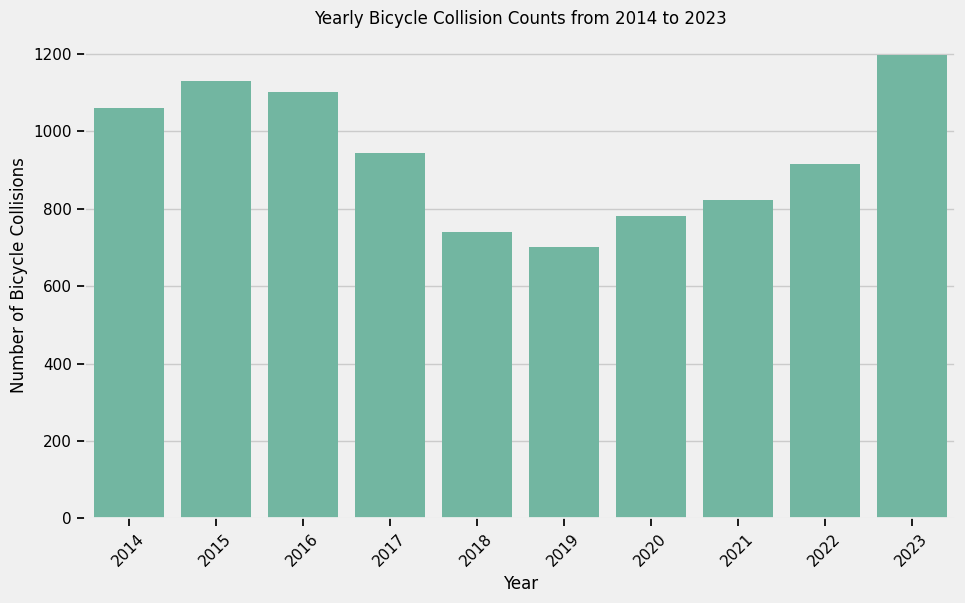

In [17]:
# Plot collisions per year from 2014 to 2023 for bicycles only
plt.figure(figsize=(10, 6))

# Set a more attractive color palette 
sns.set_palette("Set2")

# Create the count plot for bicycle collisions by year
sns.countplot(x='Year', data=collision_data_bicycles)

# Add titles and labels
plt.title('Yearly Bicycle Collision Counts from 2014 to 2023')
plt.xlabel('Year')
plt.ylabel('Number of Bicycle Collisions')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

The plot reveals fluctuations in bicycle collisions in Toronto from 2014 to 2023, with a noticeable increase in incidents from 2017 onward, peaking in 2019. The significant drop in 2020 suggests the impact of the COVID-19 pandemic, where fewer cyclists may have been on the road. Overall, the data highlights a pattern of yearly variations, potentially influenced by factors such as infrastructure changes, weather, or shifts in commuting behavior, which could inform future safety initiatives


### Monthly Collision Patterns 


The following plot visualizes the monthly distribution of bicycle collisions, color-coded by season, for the dataset. Each bar represents the total number of collisions that occurred in a particular month, with the colors indicating the season in which the collisions took place. Winter, Spring, Summer, and Fall are represented by blue, green, orange, and red, respectively. This visualization helps identify seasonal trends in bicycle accidents, highlighting patterns such as higher collision rates during certain months or seasons, which could inform safety initiatives and infrastructure planning.

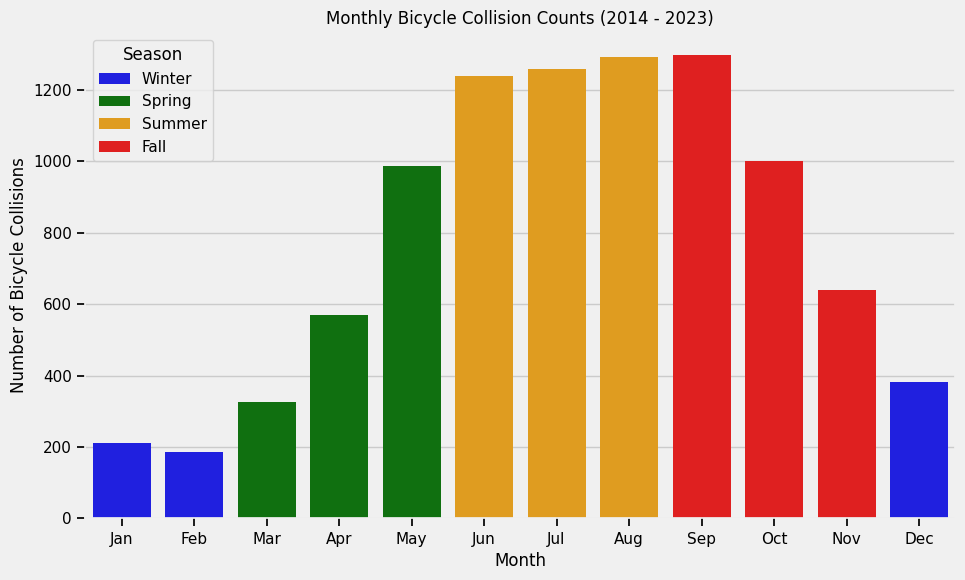

In [18]:
# Define a function to map each month to a season
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Extract the month from the 'DATE' column and map to seasons
collision_data_bicycles['Month'] = pd.to_datetime(collision_data_bicycles['DATE']).dt.month
collision_data_bicycles['Season'] = collision_data_bicycles['Month'].apply(get_season)

# Define a color palette for each season
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'red'}

# Plot collisions per month with colors representing seasons
plt.figure(figsize=(10, 6))

# Use the 'Season' column to assign colors to the bars based on the month
sns.countplot(x='Month', data=collision_data_bicycles, hue='Season', palette=season_colors)

# Add titles and labels
plt.title('Monthly Bicycle Collision Counts (2014 - 2023)')
plt.xlabel('Month')
plt.ylabel('Number of Bicycle Collisions')

# Adjust x-axis ticks to show month names
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Add a legend to differentiate the seasons
plt.legend(title='Season', loc='upper left')

# Show the plot
plt.show()



The plot reveals clear seasonal patterns in bicycle collisions, with higher collision counts during the summer months (June to August), indicated by the orange bars. Winter months (December to February), shown in blue, have the fewest collisions. This suggests that cycling activity and collision risk may be higher in warmer months, while colder months see a decrease in both cycling and collisions.

The plot reveals a clear seasonal pattern in bicycle collisions, with higher collision counts during the summer months (June to August) and a noticeable dip during the winter months (December to February). Additionally, certain years, such as 2016 and 2021, show spikes in collisions, which may reflect changes in cycling activity, weather patterns, or other factors influencing bike safety. The trends suggest that, while overall collision rates tend to rise during warmer months, there is considerable year-to-year variation, possibly due to external factors like public health initiatives or infrastructural changes.

### Day of the Week Collision Pattern

The following bar plot visualizes the number of bicycle collisions by day of the week from 2014 to 2023, with a color distinction between weekdays and weekends. Weekdays (Monday to Friday) are represented by light blue bars, while weekends (Saturday and Sunday) are represented by orange bars. This color coding allows for easy identification of differences in collision patterns between weekdays and weekends. The plot provides a clear overview of collision trends across the days of the week, highlighting any potential variations in risk or behavior depending on whether it is a weekday or weekend. A legend is included to further clarify the meaning of the colors used in the plot.

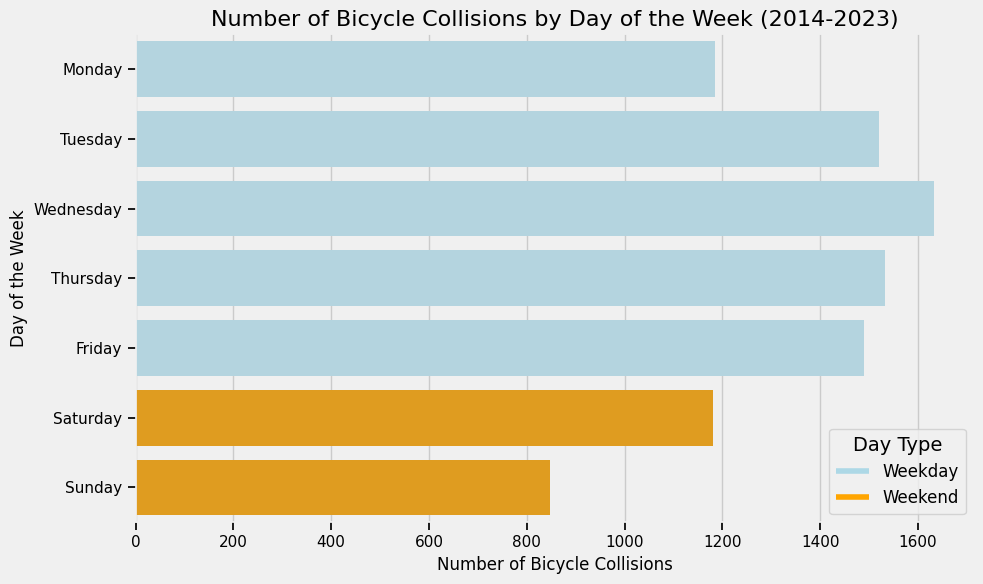

In [19]:
# Count the number of collisions for each day of the week
collisions_by_day = collision_data_bicycles['Day Of Week'].value_counts()

# Reorder the days to follow the traditional weekly order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_by_day = collisions_by_day.reindex(day_order)

# Define the colors for weekdays and weekends
# Weekdays: Monday to Friday, Weekends: Saturday and Sunday
colors = ['lightblue' if i < 5 else 'orange' for i in range(7)]

# Create a horizontal bar plot with the defined color palette
plt.figure(figsize=(10, 6))
sns.barplot(x=collisions_by_day, y=collisions_by_day.index, palette=colors)  # Color the bars based on weekdays/weekends
plt.title('Number of Bicycle Collisions by Day of the Week (2014-2023)', fontsize=16)
plt.xlabel('Number of Bicycle Collisions', fontsize=12)
plt.ylabel('Day of the Week', fontsize=12)

# Add legend manually
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color='lightblue', lw=4, label='Weekday'),
                   Line2D([0], [0], color='orange', lw=4, label='Weekend')]

plt.legend(handles=legend_elements, title='Day Type', fontsize=12, title_fontsize=14)

# Tight layout for better readability
plt.tight_layout()

# Display the plot
plt.show()


The bar plot shows a clear distinction between weekdays and weekends in terms of bicycle collisions. The light blue bars representing weekdays (Monday to Friday) are generally lower in collision counts compared to the orange bars for weekends (Saturday and Sunday). This suggests that bicycle collisions are more frequent on weekends, which could be attributed to increased cycling activity or different traffic conditions during these days. The plot also highlights that collisions are relatively consistent across weekdays, but the higher weekend counts indicate potential safety concerns during these periods. The inclusion of a legend makes it easy to interpret the color coding, providing a better understanding of the data distribution across the week.

###  Time of the Day Collision Patterns

The following bar plot visualizes the number of bicycle collisions by time of day from 2014 to 2023, categorized into four distinct time periods: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). The time of day categorization is applied to the collision data based on the hour of occurrence, with each time period represented by a different color using the 'viridis' color palette. The plot provides an overview of collision trends throughout the day, offering insights into which times are most associated with higher collision rates. The horizontal bars make it easy to compare the frequency of collisions across the different time categories, helping to identify peak times when bicycle collisions are more likely to occur.

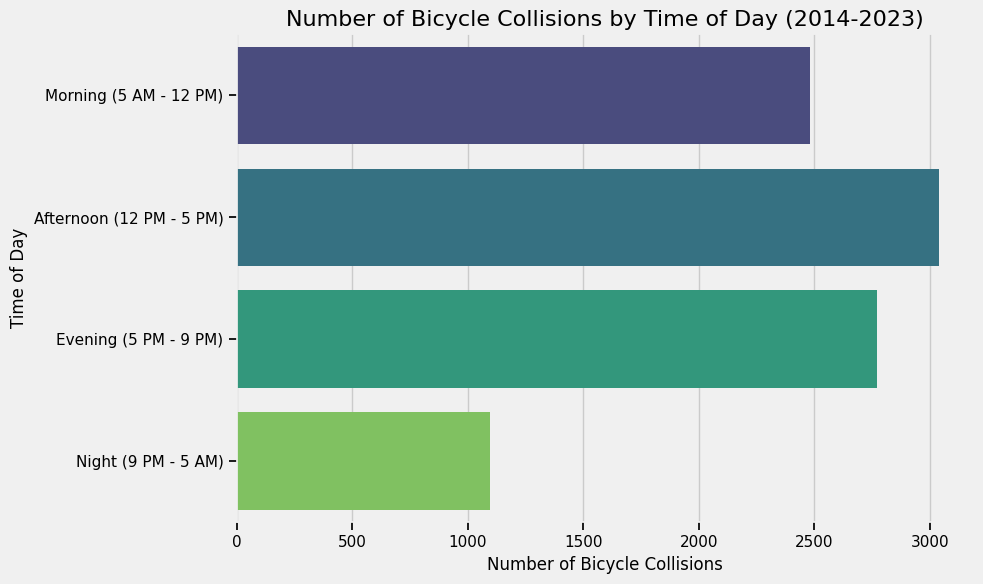

In [20]:
# Ensure the 'HOUR' column is converted to integers
collision_data_bicycles['HOUR'] = collision_data_bicycles['HOUR'].astype(int)

# Define time categories based on the hour of the day
def categorize_time(hour):
    if 5 <= hour < 12:
        return 'Morning (5 AM - 12 PM)'
    elif 12 <= hour < 17:
        return 'Afternoon (12 PM - 5 PM)'
    elif 17 <= hour < 21:
        return 'Evening (5 PM - 9 PM)'
    else:
        return 'Night (9 PM - 5 AM)'

# Apply the time categorization to the 'HOUR' column
collision_data_bicycles['TIME_OF_DAY'] = collision_data_bicycles['HOUR'].apply(categorize_time)

# Count collisions for each time category
collisions_by_time_of_day = collision_data_bicycles['TIME_OF_DAY'].value_counts()

# Reorder categories for logical time progression
time_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']
collisions_by_time_of_day = collisions_by_time_of_day.reindex(time_order)

# Create a horizontal bar plot for better readability
plt.figure(figsize=(10, 6))
sns.barplot(x=collisions_by_time_of_day, y=collisions_by_time_of_day.index, palette='viridis')  # Color palette for better visuals
plt.title('Number of Bicycle Collisions by Time of Day (2014-2023)', fontsize=16)
plt.xlabel('Number of Bicycle Collisions', fontsize=12)
plt.ylabel('Time of Day', fontsize=12)
plt.tight_layout()

# Display the plot
plt.show()



The bar plot shows that bicycle collisions tend to peak in the evening (5 PM - 9 PM), with the highest number of collisions occurring during this time. This could be attributed to increased cycling activity during the evening hours, possibly due to commuting after work or other evening activities. The morning (5 AM - 12 PM) and afternoon (12 PM - 5 PM) periods show relatively lower and more consistent collision counts, while the night period (9 PM - 5 AM) has the fewest collisions, likely due to lower cycling activity during those hours. These patterns suggest that efforts to improve safety may need to be particularly focused on the evening hours when collision rates are highest.

### Relationship between Month and Year

The following line plot visualizes the trends in bicycle collisions over time, broken down by month, for the years 2014 to 2023. Each point represents the number of bicycle collisions that occurred in a specific month, with different lines corresponding to each year. The plot uses a custom color palette to distinguish between years, making it easy to identify patterns or changes in collision rates across the years. The x-axis displays the months, while the y-axis shows the number of collisions, allowing for an in-depth analysis of temporal trends in bicycle safety. This visualization provides valuable insights into how monthly collision rates have evolved over the past decade.

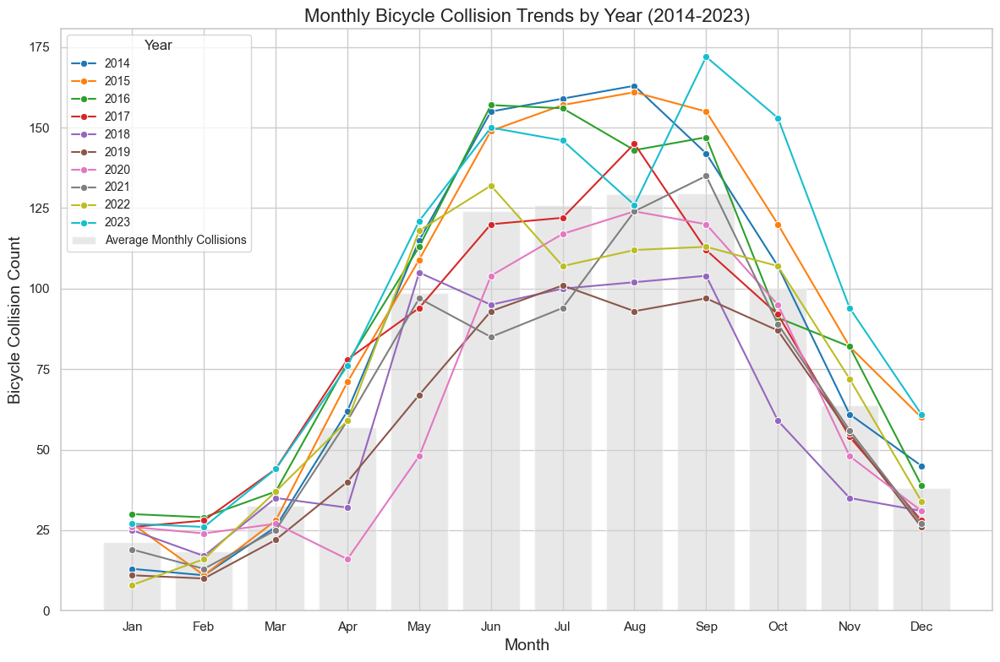

In [75]:
# Group data by Year and Month, and count collisions
monthly_collision_counts = collision_data_bicycles.groupby(['Year', 'Month']).size().reset_index(name='Bicycle_Collision_Count')

# Calculate the average monthly collision count across all years
average_monthly_collisions = monthly_collision_counts.groupby('Month')['Bicycle_Collision_Count'].mean().reset_index(name='Average_Collision_Count')

# Create a line plot with a custom color palette
plt.figure(figsize=(12, 8))

# Plot the bar plot for the average monthly collisions
plt.bar(average_monthly_collisions['Month'], average_monthly_collisions['Average_Collision_Count'], 
        color='lightgray', label='Average Monthly Collisions', alpha=0.5)

sns.lineplot(
    data=monthly_collision_counts,
    x='Month',
    y='Bicycle_Collision_Count',
    hue='Year',
    marker='o',
    palette='tab10'  
)

# Customize the plot
plt.title("Monthly Bicycle Collision Trends by Year (2014-2023)", fontsize=16)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Bicycle Collision Count", fontsize=14)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend(title="Year", fontsize=10, title_fontsize=12)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

### Relationship between Day of the Week and Month

The following heatmap visualizes the number of bicycle collisions by day of the week and month from 2014 to 2023. The data is organized into a pivot table that cross-references the days of the week with each month of the year, providing a clear overview of collision patterns throughout the year. The heatmap uses color intensity to indicate the frequency of collisions, with darker colors representing higher collision counts. By including annotations on each cell, the heatmap allows for a detailed examination of collision trends across different days and months. This visualization helps to identify peak times for bicycle collisions, highlighting specific months or days of the week with higher accident rates, and can be useful for targeting safety interventions.

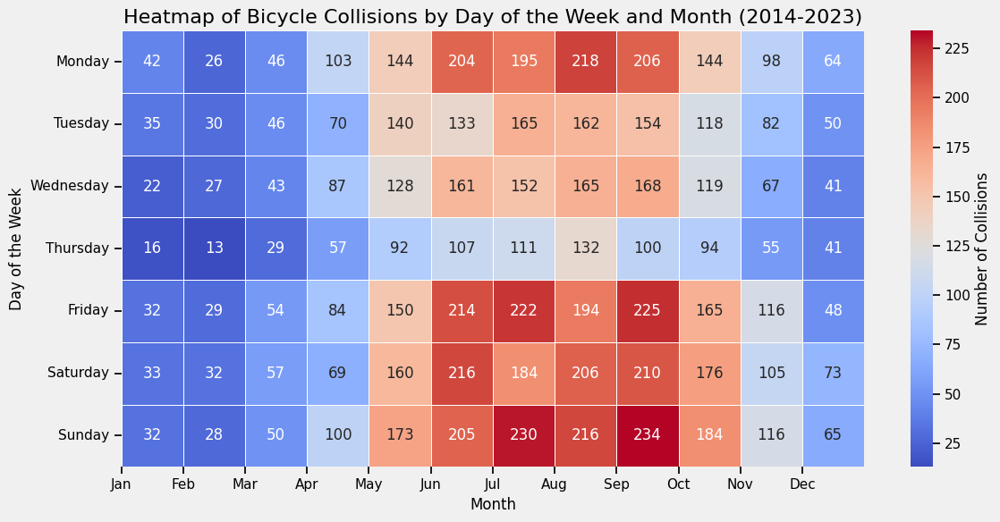

In [22]:
# Create a pivot table with counts of collisions by month and day of the week
collisions_pivot = collision_data_bicycles.pivot_table(index='Day Of Week', columns='Month', aggfunc='size', fill_value=0)

# Reorder the days of the week to follow the traditional order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_pivot.index = day_order

# Create a heatmap to represent the number of collisions by day of the week and month
plt.figure(figsize=(12, 6))
sns.heatmap(collisions_pivot, annot=True, fmt='d', cmap='coolwarm', linewidths=0.5, cbar_kws={'label': 'Number of Collisions'})

# Add titles and labels
plt.title('Heatmap of Bicycle Collisions by Day of the Week and Month (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Day of the Week', fontsize=12)
plt.xticks(ticks=range(12), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.tight_layout()

# Display the plot
plt.show()

### Relationship between Time of Day and Day of the Week 

The following line graph visualizes the relationship between the time of day and the number of bicycle collisions across the days of the week, based on data from 2014 to 2023. The time of day is categorized into four distinct periods: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). Each line represents the number of collisions during one of these time periods, plotted across the days of the week. The graph helps to identify patterns in collision frequency, highlighting the times of day that are most associated with bicycle accidents on different days. The legend is positioned outside the plot for better clarity, making it easy to differentiate between the time categories.

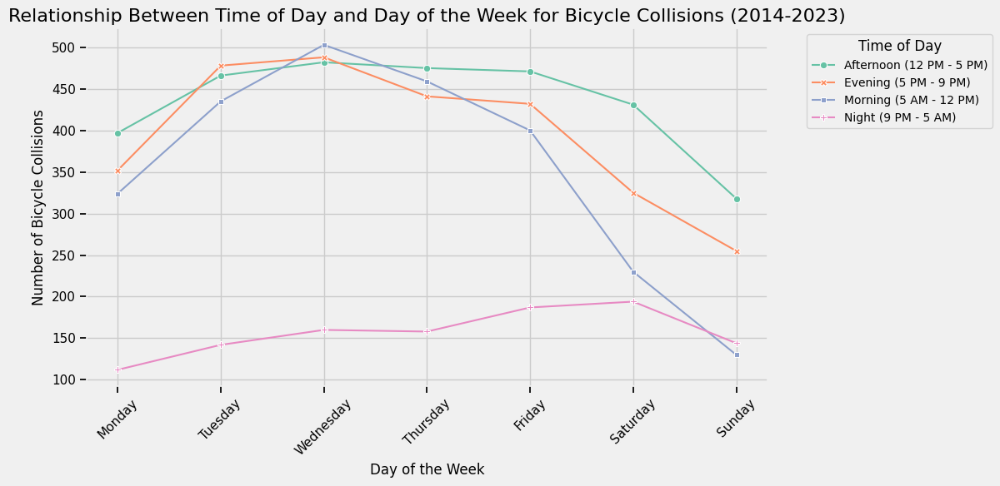

In [23]:
# Ensure 'HOUR' column is in integer format (if not already)
collision_data_bicycles['HOUR'] = collision_data_bicycles['HOUR'].astype(int)

# Define time categories based on the hour of the day
def categorize_time(hour):
    if 5 <= hour < 12:
        return 'Morning (5 AM - 12 PM)'
    elif 12 <= hour < 17:
        return 'Afternoon (12 PM - 5 PM)'
    elif 17 <= hour < 21:
        return 'Evening (5 PM - 9 PM)'
    else:
        return 'Night (9 PM - 5 AM)'

# Apply the time categorization to the 'HOUR' column
collision_data_bicycles['TIME_OF_DAY'] = collision_data_bicycles['HOUR'].apply(categorize_time)

# Group the data by 'Day Of Week' and 'TIME_OF_DAY' and count the collisions
collisions_by_day_time = collision_data_bicycles.groupby(['Day Of Week', 'TIME_OF_DAY']).size().reset_index(name='Bicycle_Collision_Count')

# Reorder days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_by_day_time['Day Of Week'] = pd.Categorical(collisions_by_day_time['Day Of Week'], categories=day_order, ordered=True)

# Pivot data for line plot
collisions_pivot = collisions_by_day_time.pivot(index='Day Of Week', columns='TIME_OF_DAY', values='Bicycle_Collision_Count')

# Create a line plot to show relationship between Time of Day and Day of the Week
plt.figure(figsize=(12, 6))
sns.lineplot(data=collisions_pivot, markers=True, dashes=False)

# Customize the plot
plt.title('Relationship Between Time of Day and Day of the Week for Bicycle Collisions (2014-2023)', fontsize=16)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Number of Bicycle Collisions', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)

# Move the legend to the side (outside the plot area)
plt.legend(title='Time of Day', fontsize=10, title_fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()



## Import Ward Data

To begin analyzing the geographic distribution of bicycle collisions, we will import ward data for the City of Toronto. This dataset provides detailed information about the boundaries and identifiers of Toronto’s various wards, which will allow us to spatially map the collision data and analyze patterns specific to each ward. By integrating this data with our collision data, we can gain insights into how accidents are distributed across different areas of the city, helping to identify regions with higher collision rates and areas that may require targeted safety measures.

In [24]:
# Load the GeoJSON file generated (adjust the path if needed)
ward_data = gpd.read_file('../Clean Data/wards_data.geojson')  

# View geoDataFrame
ward_data.head()

,WARD NUMBER,WARD NAME,WARD DISTRICT,geometry
0,01,Etobicoke North,Etobicoke York,"POLYGON ((614361.910 4846443.252, 614376.274 4..."
1,02,Etobicoke Centre,Etobicoke York,"POLYGON ((618769.981 4839786.381, 618770.007 4..."
2,03,Etobicoke-Lakeshore,Etobicoke York,"POLYGON ((621184.054 4834315.989, 621213.577 4..."
3,04,Parkdale-High Park,Toronto and East York,"POLYGON ((623660.782 4836061.188, 623724.263 4..."
4,05,York South-Weston,Etobicoke York,"POLYGON ((623361.036 4840391.392, 623364.743 4..."



Since the ward data has already been cleaned and analyzed, we only need to import it and correlate it with the collision data.

## Overlay Collision Data onto Ward Data 

To better understand the spatial distribution of bicycle collisions across Toronto, we will overlay the collision data onto the ward data. This process will allow us to visualize how collisions are distributed within the city's various wards, helping to identify areas with higher accident rates. By mapping the collision data to the ward boundaries, we can analyze the relationship between specific locations and collision frequency, which can inform targeted interventions for improving cyclist safety in high-risk areas.


In [30]:
# Convert collision data to GeoDataFrame
collision_data_bicycles["geometry"] = collision_data_bicycles.apply(lambda row: Point(row["LONGITUDE"], row["LATITUDE"]), axis=1)
collision_data_bicycles = gpd.GeoDataFrame(collision_data_bicycles, geometry="geometry", crs="EPSG:4326")

In [44]:
# Ensure CRS matches between collision data and ward data
if collision_data_bicycles.crs != ward_data.crs:
    collision_data_bicycles = collision_data_bicycles.to_crs(ward_data.crs)

# Create a folium map centered on Toronto (adjust latitude and longitude as needed)
map_wards = folium.Map(location=[43.7, -79.4], zoom_start=11)

# Convert ward data to GeoJSON format for folium
ward_data_json = ward_data.to_json()
folium.GeoJson(ward_data_json, name="Wards").add_to(map_wards)

# Add collision points (make sure geometry is in proper format)
sample_data = collision_data_bicycles.head(10)  # Take a sample of 10 rows
for _, row in sample_data.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=20,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6
    ).add_to(map_wards)

# Add layer control (optional, to toggle layers on/off)
folium.LayerControl().add_to(map_wards)

# Display the map
map_wards

In [35]:
# Perform the spatial join to find which ward each collision occurred in
collision_with_wards = gpd.sjoin(collision_data_bicycles, ward_data, how="left", op="within")

# Drop unnecessary geometry columns for tabular display
collision_table = collision_with_wards.drop(columns=["geometry", "index_right"])

# Rename columns in the GeoDataFrame
collision_table.rename(columns={
    'AREA_TYPE': 'Ward_Number',           
    'AREA_NAME': 'Ward_Name'
}, inplace=True)

# Display the table in the notebook
collision_table.tail()  # Display first few rows of the table

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,Year,Month,Day Of Week,Season,TIME_OF_DAY,WARD NUMBER,WARD NAME,WARD DISTRICT
652614,2023-12-29,18,-79.251249,43.718836,YES,2023,12,Friday,Winter,Evening (5 PM - 9 PM),20,Scarborough Southwest,Scarborough
652678,2023-12-29,9,-79.422689,43.654396,YES,2023,12,Friday,Winter,Morning (5 AM - 12 PM),11,University-Rosedale,Toronto and East York
652848,2023-12-30,13,-79.388216,43.666811,YES,2023,12,Saturday,Winter,Afternoon (12 PM - 5 PM),13,Toronto Centre,Toronto and East York
652851,2023-12-30,11,-79.273974,43.822500,YES,2023,12,Saturday,Winter,Morning (5 AM - 12 PM),23,Scarborough North,Scarborough
652881,2023-12-31,12,-79.429433,43.652967,YES,2023,12,Sunday,Winter,Afternoon (12 PM - 5 PM),09,Davenport,Toronto and East York


In [28]:
# Convert 'DATE' field to string to avoid compatibility issues
if 'DATE' in collision_table.columns:
    collision_table['DATE'] = collision_table['DATE'].astype(str)

# Ensure 'geometry' column exists for GeoDataFrame compatibility
if 'geometry' not in collision_table.columns:
    collision_table['geometry'] = collision_table.apply(
        lambda row: Point(row['LONGITUDE'], row['LATITUDE']), axis=1
    )

# Convert to GeoDataFrame
collision_table_geo = gpd.GeoDataFrame(collision_table, geometry=collision_table['geometry'], crs="EPSG:4326")

# Save the GeoDataFrame to a GeoJSON file
output_geojson_path = "collision_data_with_wards.geojson"
collision_table_geo.to_file(output_geojson_path, driver="GeoJSON")


## Exploratory Data Analysis with Bicyle Collision and Ward Data (2014 to 2023)



### Bicycle Collisions Across Wards from 2014 to 2023

The following line graph visualizes the total number of bicycle collisions across various wards in Toronto from 2014 to 2023. Each ward is represented by a distinct color, allowing for easy comparison of collision trends over time. The x-axis shows the years, while the y-axis represents the number of collisions recorded. By using unique colors for each ward, this graph highlights how collision frequencies fluctuate from year to year across different areas of the city, providing valuable insights into the spatial and temporal distribution of bicycle-related accidents.

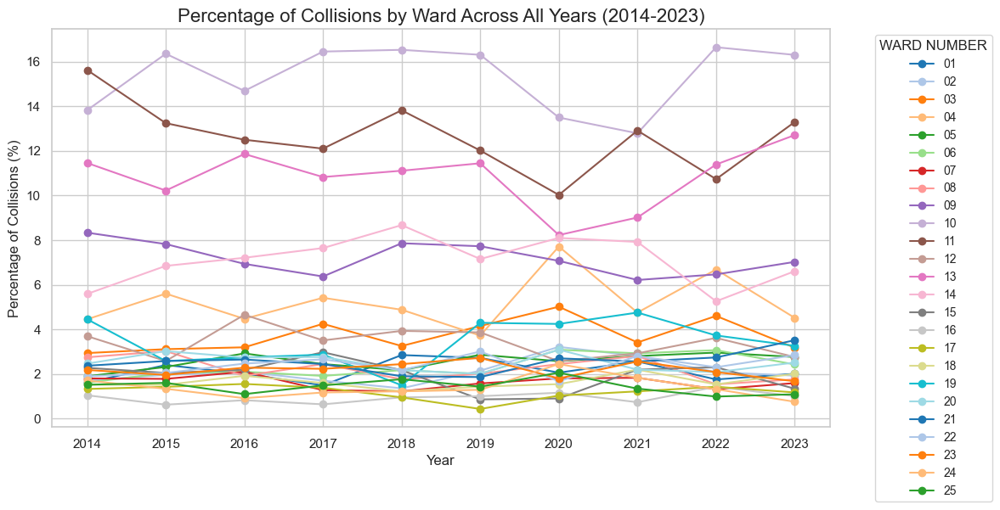

In [76]:
# Grouping by ward, ward name, and year for the total collision count across all years
ward_yearly_collisions = collision_table.groupby(["WARD NUMBER", "WARD NAME", "Year"]).size().reset_index(name="Collisions")

# Calculate total collisions for each year across all wards
total_collisions_per_year = ward_yearly_collisions.groupby('Year')['Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
ward_yearly_collisions = pd.merge(ward_yearly_collisions, total_collisions_per_year, on='Year')
ward_yearly_collisions['Percentage_of_Collisions'] = (ward_yearly_collisions['Collisions'] / ward_yearly_collisions['Total_Collisions']) * 100

# Generate a color palette for each ward (ensuring each ward gets a different color)
unique_colors = sns.color_palette("tab20", n_colors=len(ward_yearly_collisions['WARD NAME'].unique()))

# Plotting the line graph for percentage of collisions across all years (one line for each ward)
plt.figure(figsize=(12, 6))

# Loop through each unique ward and plot a line graph for percentage
for idx, ward in enumerate(ward_yearly_collisions['WARD NUMBER'].unique()):
    ward_data = ward_yearly_collisions[ward_yearly_collisions['WARD NUMBER'] == ward]
    plt.plot(ward_data['Year'], ward_data['Percentage_of_Collisions'], label=ward, color=unique_colors[idx], marker='o')

# Adding titles and labels
plt.title("Percentage of Collisions by Ward Across All Years (2014-2023)", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Percentage of Collisions (%)", fontsize=12)

# Customize x-ticks for year range
plt.xticks(range(2014, 2024))

# Add legend and grid
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
plt.grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()

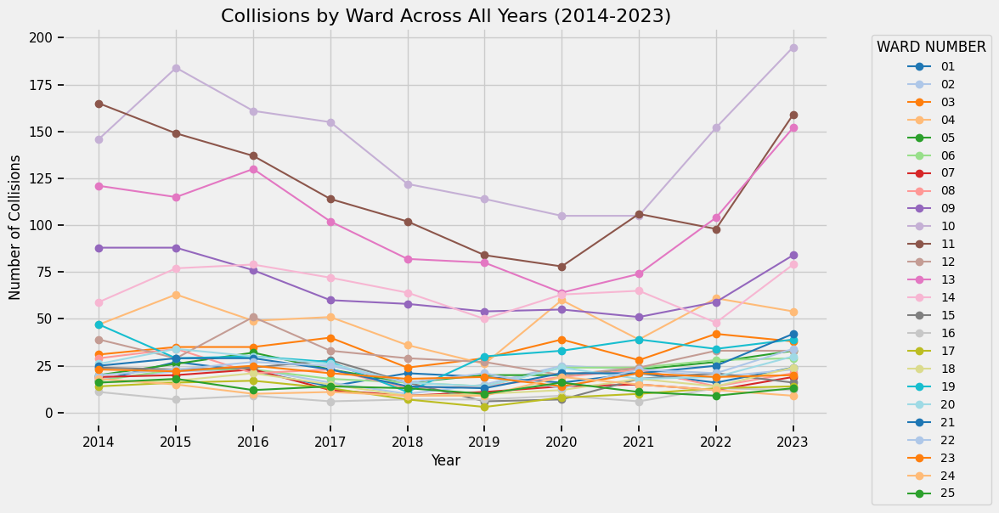

In [52]:
# Grouping by ward and year for the total collision count across all years
ward_yearly_collisions = collision_table.groupby(["WARD NUMBER", "WARD NAME", "Year"]).size().reset_index(name="Collisions")

# Generate a color palette for each ward (ensuring each ward gets a different color)
unique_colors = sns.color_palette("tab20", n_colors=len(ward_yearly_collisions['WARD NAME'].unique()))

# Plotting the line graph for collisions across all years (one line for each ward)
plt.figure(figsize=(12, 6))

# Loop through each unique ward and plot a line graph
for idx, ward in enumerate(ward_yearly_collisions['WARD NUMBER'].unique()):
    ward_data = ward_yearly_collisions[ward_yearly_collisions['WARD NUMBER'] == ward]
    plt.plot(ward_data['Year'], ward_data['Collisions'], label=ward, color=unique_colors[idx], marker='o')

# Adding titles and labels
plt.title("Collisions by Ward Across All Years (2014-2023)", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Collisions", fontsize=12)

# Customize x-ticks for year range
plt.xticks(range(2014, 2024))

# Add legend and grid
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
plt.grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()


### Collisions across all Wards every month from 2014 to 2023

The following line graph visualizes the total number of bicycle collisions across various wards in Toronto from 2014 to 2023, aggregated by month. Each ward number is represented by a distinct line, with different colors assigned to each ward for easy identification. The x-axis represents the months of the year, while the y-axis shows the total number of collisions in each respective ward. This visualization allows for a clear comparison of collision trends across wards throughout the year, providing insight into any seasonal fluctuations or patterns in bicycle collisions within different areas of the city.

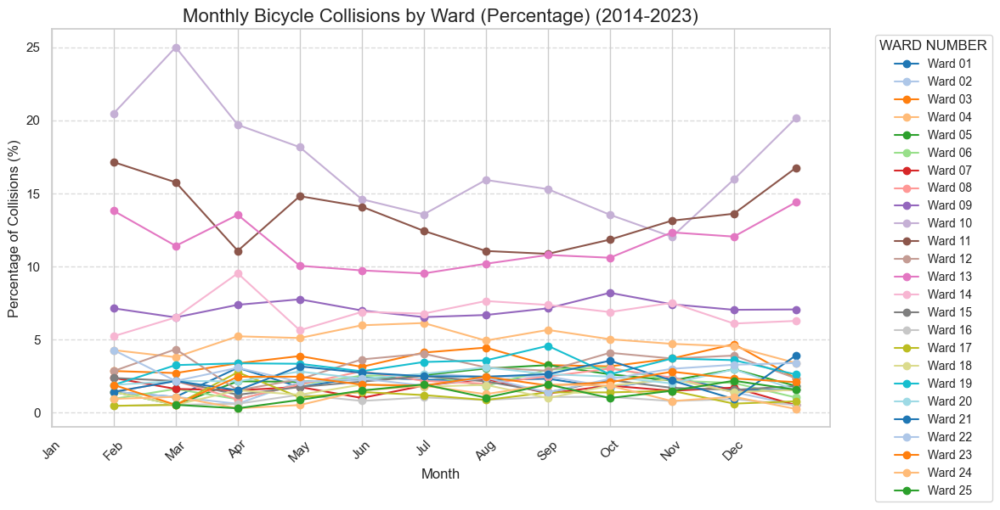

In [77]:
# Group by Ward Number and Month to get the total number of collisions across all years
monthly_collisions_by_ward = collision_table.groupby(['WARD NUMBER', 'Month']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each month across all wards
total_collisions_per_month = monthly_collisions_by_ward.groupby('Month')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the monthly ward-level data to calculate percentage
monthly_collisions_by_ward = pd.merge(monthly_collisions_by_ward, total_collisions_per_month, on='Month')
monthly_collisions_by_ward['Percentage_of_Collisions'] = (monthly_collisions_by_ward['Number of Collisions'] / monthly_collisions_by_ward['Total_Collisions']) * 100

# Define months for the x-axis
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set up a color palette with different colors for each ward
ward_numbers = monthly_collisions_by_ward['WARD NUMBER'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for percentage of collisions for each ward
plt.figure(figsize=(12, 6))
for i, ward in enumerate(ward_numbers):
    ward_data = monthly_collisions_by_ward[monthly_collisions_by_ward['WARD NUMBER'] == ward]
    plt.plot(ward_data['Month'], ward_data['Percentage_of_Collisions'], marker='o', label=f'Ward {ward}', color=palette[i])

# Customize the plot
plt.title('Monthly Bicycle Collisions by Ward (Percentage) (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(ticks=range(12), labels=months, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()

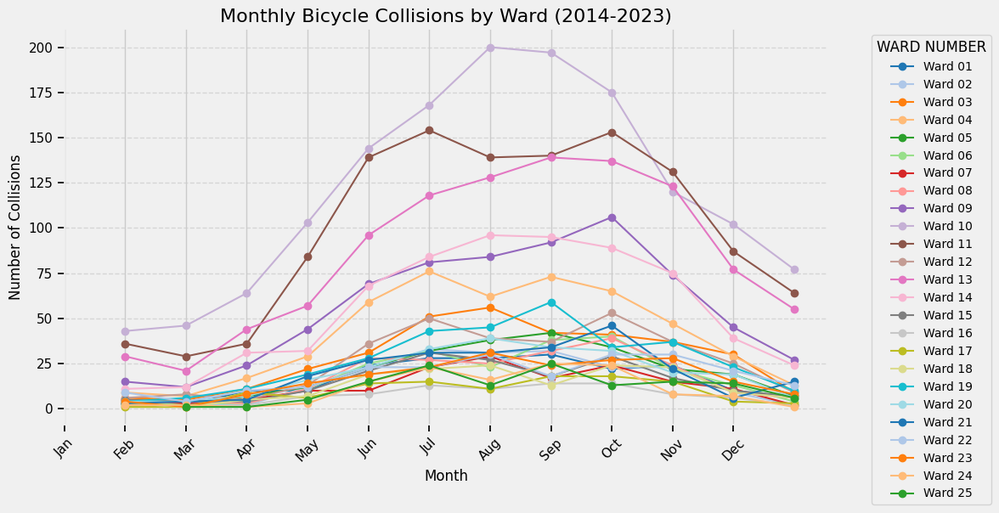

In [55]:
# Group by Ward Number and Month to get the total number of collisions across all years
monthly_collisions_by_ward = collision_table.groupby(['WARD NUMBER', 'Month']).size().reset_index(name='Number of Collisions')

# Define months for the x-axis
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set up a color palette with different colors for each ward
import seaborn as sns
ward_numbers = monthly_collisions_by_ward['WARD NUMBER'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for each ward
plt.figure(figsize=(12, 6))
for i, ward in enumerate(ward_numbers):
    ward_data = monthly_collisions_by_ward[monthly_collisions_by_ward['WARD NUMBER'] == ward]
    plt.plot(ward_data['Month'], ward_data['Number of Collisions'], marker='o', label=f'Ward {ward}', color=palette[i])

# Customize the plot
plt.title('Monthly Bicycle Collisions by Ward (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(ticks=range(12), labels=months, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()

### Collisions Across all Wards Day of the Week


The following graph visualizes the distribution of bicycle collisions across various wards in relation to the days of the week, based on data from 2014 to 2023. Each line represents a specific ward, with the x-axis indicating the days of the week (Monday through Sunday). The y-axis shows the total number of collisions reported for each ward on each day. The different colored lines correspond to different wards, providing an easy comparison of collision trends across the city. This visualization helps to identify patterns in bicycle collisions related to specific days and wards, offering insights into potential areas for targeted safety measures.

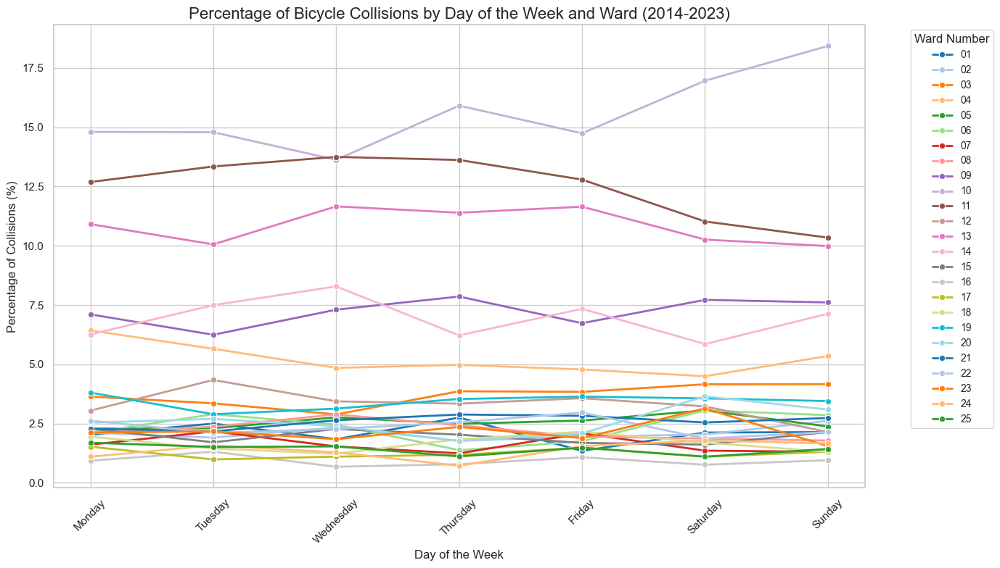

In [78]:
# Group by Ward Number and Day of Week to get the total number of collisions for each day in each ward
collisions_by_day_ward = collision_table.groupby(['Day Of Week', 'WARD NUMBER']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each day of the week across all wards
total_collisions_per_day = collisions_by_day_ward.groupby('Day Of Week')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
collisions_by_day_ward = pd.merge(collisions_by_day_ward, total_collisions_per_day, on='Day Of Week')
collisions_by_day_ward['Percentage_of_Collisions'] = (collisions_by_day_ward['Number of Collisions'] / collisions_by_day_ward['Total_Collisions']) * 100

# Define the order of the days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reorder the Day of Week column
collisions_by_day_ward['Day Of Week'] = pd.Categorical(collisions_by_day_ward['Day Of Week'], categories=day_order, ordered=True)
collisions_by_day_ward = collisions_by_day_ward.sort_values(['Day Of Week', 'WARD NUMBER'])

# Set up the plot
plt.figure(figsize=(14, 8))

# Plotting the line graph for percentage of collisions for each ward, with each line representing a ward number
sns.lineplot(data=collisions_by_day_ward, 
             x='Day Of Week', 
             y='Percentage_of_Collisions', 
             hue='WARD NUMBER', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Percentage of Bicycle Collisions by Day of the Week and Ward (2014-2023)', fontsize=16)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Ward Number', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

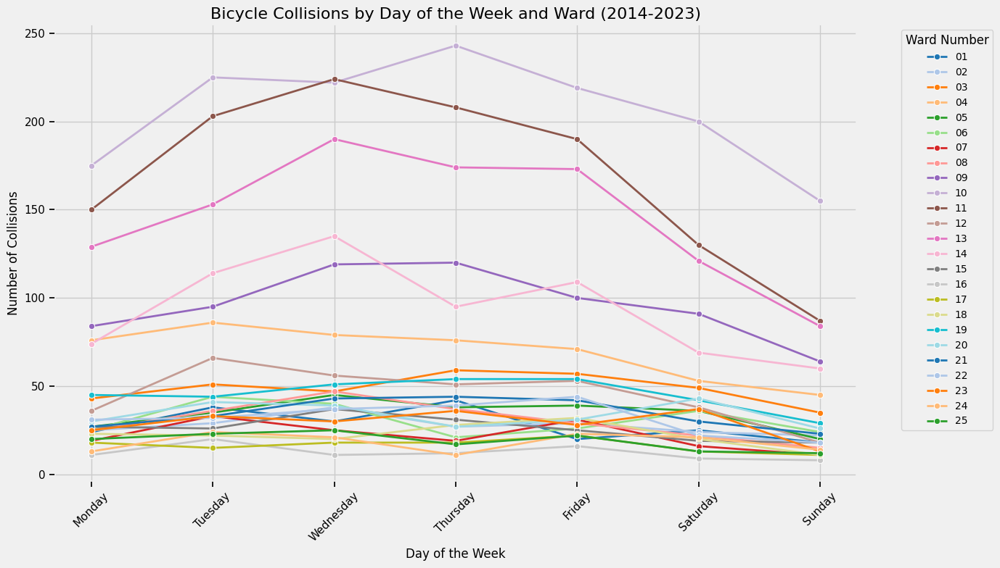

In [58]:
# Group by Ward Number and Day of Week to get the total number of collisions for each day in each ward
collisions_by_day_ward = collision_table.groupby(['Day Of Week', 'WARD NUMBER']).size().reset_index(name='Number of Collisions')

# Define the order of the days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reorder the Day of Week column
collisions_by_day_ward['Day Of Week'] = pd.Categorical(collisions_by_day_ward['Day Of Week'], categories=day_order, ordered=True)
collisions_by_day_ward = collisions_by_day_ward.sort_values(['Day Of Week', 'WARD NUMBER'])

# Set up the plot
plt.figure(figsize=(14, 8))

# Plotting the line graph for each ward with each line representing a ward number
sns.lineplot(data=collisions_by_day_ward, 
             x='Day Of Week', 
             y='Number of Collisions', 
             hue='WARD NUMBER', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Bicycle Collisions by Day of the Week and Ward (2014-2023)', fontsize=16)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Ward Number', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

### Collisions across all Ward for Time of Day


The following line graph visualizes the distribution of bicycle collisions across different wards in the city, categorized by time of day, over the period from 2014 to 2023. The x-axis represents four distinct time intervals: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). Each line corresponds to a different ward, with its number of collisions plotted against the time of day. This graph allows for a comparison of collision frequencies by time period across various wards, providing insights into when and where collisions are most likely to occur within the city. The colors distinguish each ward, and a legend is included to identify them.

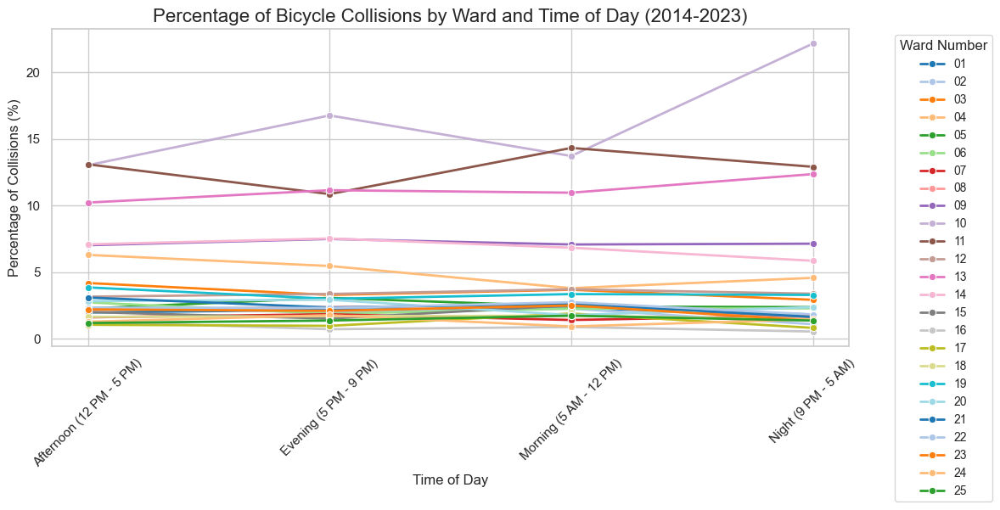

In [79]:
# Group by Ward Number and Time of Day to get the total number of collisions
collisions_by_ward_time = collision_table.groupby(['WARD NUMBER', 'TIME_OF_DAY']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each time of day across all wards
total_collisions_per_time_of_day = collisions_by_ward_time.groupby('TIME_OF_DAY')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
collisions_by_ward_time = pd.merge(collisions_by_ward_time, total_collisions_per_time_of_day, on='TIME_OF_DAY')
collisions_by_ward_time['Percentage_of_Collisions'] = (collisions_by_ward_time['Number of Collisions'] / collisions_by_ward_time['Total_Collisions']) * 100

# Define the time categories for the x-axis
time_of_day_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']

# Set up the plot
plt.figure(figsize=(12, 6))

# Plotting the line graph for percentage of collisions for each ward, with each line representing a ward number
sns.lineplot(data=collisions_by_ward_time, 
             x='TIME_OF_DAY', 
             y='Percentage_of_Collisions', 
             hue='WARD NUMBER', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Percentage of Bicycle Collisions by Ward and Time of Day (2014-2023)', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Ward Number', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

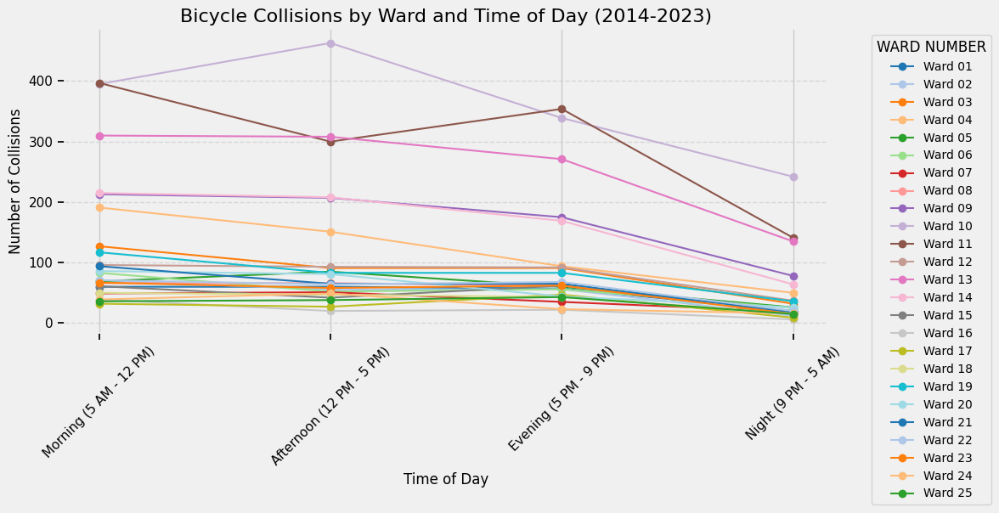

In [60]:
# Group by Ward Number and Time of Day to get the total number of collisions
collisions_by_ward_time = collision_table.groupby(['WARD NUMBER', 'TIME_OF_DAY']).size().reset_index(name='Number of Collisions')

# Define the time categories for the x-axis
time_of_day_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']

# Set up a color palette with different colors for each ward
import seaborn as sns
ward_numbers = collisions_by_ward_time['WARD NUMBER'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for each ward
plt.figure(figsize=(12, 6))
for i, ward in enumerate(ward_numbers):
    ward_data = collisions_by_ward_time[collisions_by_ward_time['WARD NUMBER'] == ward]
    plt.plot(ward_data['TIME_OF_DAY'], ward_data['Number of Collisions'], marker='o', label=f'Ward {ward}', color=palette[i])

# Customize the plot
plt.title('Bicycle Collisions by Ward and Time of Day (2014-2023)', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(ticks=range(4), labels=time_of_day_order, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()

### Relationship between Time of the Day and Day of the Week 

I DONT THINK THIS WILL WORK I THINK I AM TRYING TO PLOT TOO MANY THINGS AT ONCE LMK IF YALL ANY SUGGESTIONS

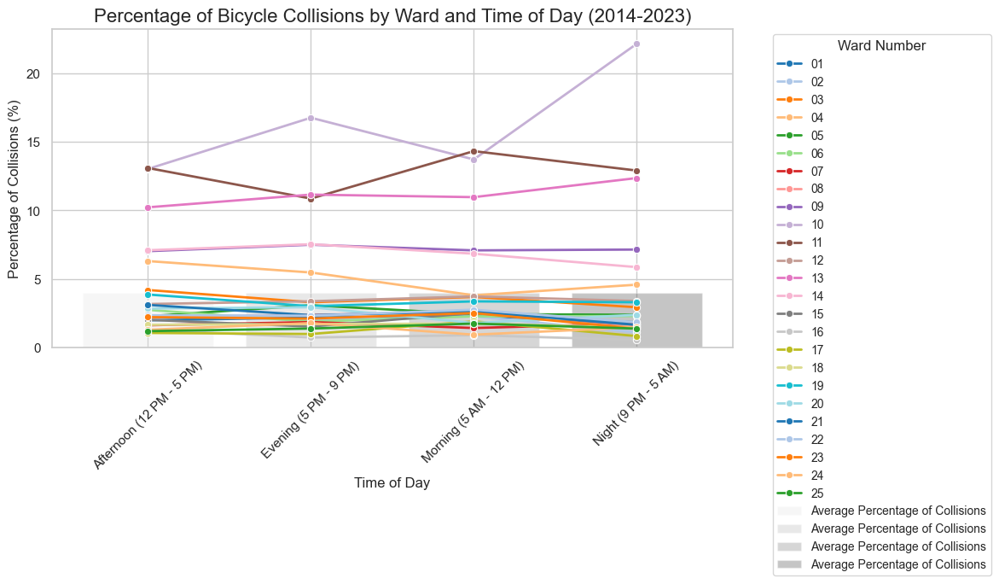

In [90]:
# Group by Ward Number and Time of Day to get the total number of collisions
collisions_by_ward_time = collision_table.groupby(['WARD NUMBER', 'TIME_OF_DAY']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each time of day across all wards
total_collisions_per_time_of_day = collisions_by_ward_time.groupby('TIME_OF_DAY')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
collisions_by_ward_time = pd.merge(collisions_by_ward_time, total_collisions_per_time_of_day, on='TIME_OF_DAY')
collisions_by_ward_time['Percentage_of_Collisions'] = (collisions_by_ward_time['Number of Collisions'] / collisions_by_ward_time['Total_Collisions']) * 100

# Define the time categories for the x-axis
time_of_day_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']

# Calculate the average percentage of collisions across all wards for each time of day
average_percentage_by_time = collisions_by_ward_time.groupby('TIME_OF_DAY')['Percentage_of_Collisions'].mean().reset_index(name='Average_Percentage')

# Set up the plot
plt.figure(figsize=(12, 6))

# Plot the faint-colored bars for the average percentage of collisions for each time of day
sns.barplot(data=average_percentage_by_time, 
            x='TIME_OF_DAY', 
            y='Average_Percentage', 
            palette='Greys',  # Use a grayscale palette for faint bars
            alpha=0.3,  # Make bars faint
            ci=None,  # Disable confidence interval
            label='Average Percentage of Collisions')

# Plotting the line graph for percentage of collisions for each ward
sns.lineplot(data=collisions_by_ward_time, 
             x='TIME_OF_DAY', 
             y='Percentage_of_Collisions', 
             hue='WARD NUMBER', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Percentage of Bicycle Collisions by Ward and Time of Day (2014-2023)', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Ward Number', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Display a grid
plt.grid(True)

# Adjust the layout to avoid clipping of labels
plt.tight_layout()

# Show the plot
plt.show()

### Yearly Number of Collisions across all Ward Districts 

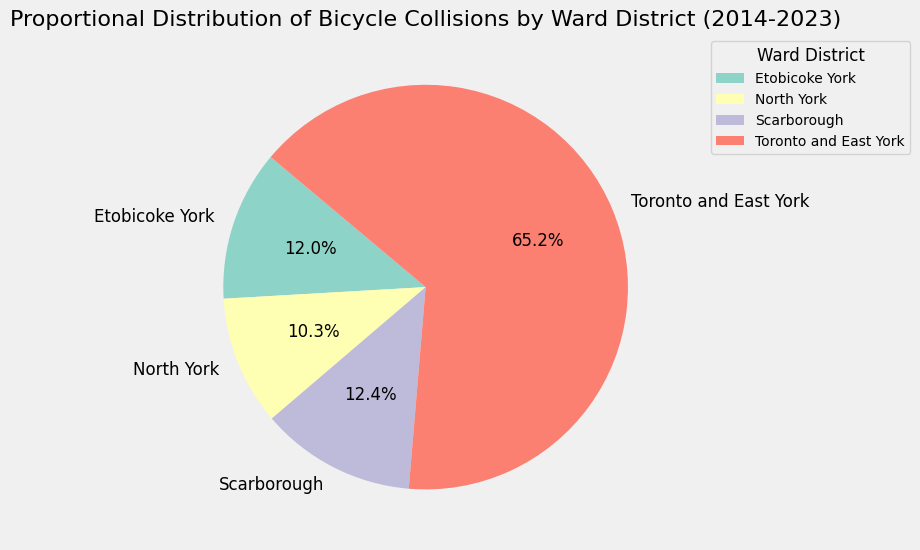

In [63]:
# Group by Ward District to get the total number of collisions across all years
collisions_by_ward = collision_table.groupby('WARD DISTRICT').size().reset_index(name='Number of Collisions')

# Set up a color palette to differentiate each ward
import seaborn as sns
palette = sns.color_palette("Set3", len(collisions_by_ward))

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(collisions_by_ward['Number of Collisions'], 
        labels=collisions_by_ward['WARD DISTRICT'], 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=palette, 
        textprops={'fontsize': 12})

# Add title and ensure the aspect ratio is equal for a proper pie chart
plt.title('Proportional Distribution of Bicycle Collisions by Ward District (2014-2023)', fontsize=16)

# Add a legend for clarity (outside the pie chart)
plt.legend(collisions_by_ward['WARD DISTRICT'], title="Ward District", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

### Monthly Number of Collisions across all Ward Districts 

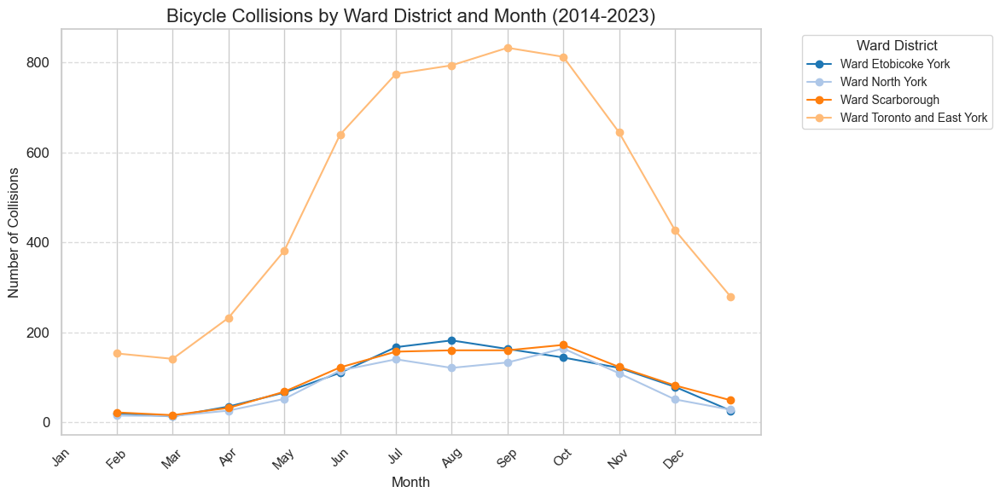

In [69]:
# Group by Month and Ward Number to get the total number of collisions for each ward district per month
collisions_by_month_ward = collision_table.groupby(['Month', 'WARD DISTRICT']).size().reset_index(name='Number of Collisions')

# Define the months for x-axis
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set up a color palette with different colors for each ward
ward_numbers = collisions_by_month_ward['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for each ward district
plt.figure(figsize=(12, 6))
for i, ward in enumerate(ward_numbers):
    ward_data = collisions_by_month_ward[collisions_by_month_ward['WARD DISTRICT'] == ward]
    plt.plot(ward_data['Month'], ward_data['Number of Collisions'], marker='o', label=f'Ward {ward}', color=palette[i])

# Customizing the plot
plt.title('Bicycle Collisions by Ward District and Month (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(ticks=range(12), labels=months, rotation=45)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend to the plot
plt.legend(title="Ward District", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Tight layout for better presentation
plt.tight_layout()

# Display the plot
plt.show()